Bu proje, müşterilerin finansal risk seviyelerini tahmin etmek amacıyla çeşitli demografik ve finansal verileri kullanarak makine öğrenmesi modelleri oluşturmayı amaçlamaktadır. Veriler, müşterilerin yaş, cinsiyet, eğitim düzeyi, gelir, kredi skoru gibi bilgilerini içermektedir. Projenin amacı, hangi müşterilerin daha yüksek risk taşıdığını belirlemek ve bu bilgiler doğrultusunda finansal kararlar almayı kolaylaştırmaktır.

In [2]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.tree import plot_tree, export_text
%matplotlib inline

Bu çalışmada model oluşturmak ve görselleştirmek için gerekli olan tüm kütüphaneleri ve metotları içe aktardık.

Veri setimizi pandas kütüphanesi ile df isimli DataFrame'e atadık.

In [5]:
df = pd.read_csv("financial_risk.csv")

Daha sonra veri yapısını anlamaya çalışmak için 'head' ile ilk 5 satırı görüntüledik.

In [7]:
df.head()

,Age,Gender,Education Level,Marital Status,Income,Credit Score,Loan Amount,Loan Purpose,Employment Status,Years at Current Job,Payment History,Debt-to-Income Ratio,Assets Value,Number of Dependents,City,State,Country,Previous Defaults,Marital Status Change,Risk Rating
0,49,Male,PhD,Divorced,100019.697697,723.0,45713.0,Business,Unemployed,19,Fair,0.154313,120228.0,0.0,Port Elizabeth,AS,Cyprus,2.0,2,Low
1,25,Non-binary,Master's,Widowed,67507.648498,791.0,36528.0,Personal,Unemployed,10,Good,0.143242,287140.0,NaN,New Heather,IL,Namibia,3.0,1,Low
2,31,Non-binary,PhD,Widowed,51144.937595,693.0,6553.0,Personal,Self-employed,1,Excellent,0.378890,NaN,NaN,West Lindaview,MD,Bouvet Island (Bouvetoya),0.0,1,Low
3,18,Male,Master's,Widowed,124977.733392,NaN,NaN,Business,Unemployed,10,Fair,0.396636,246597.0,1.0,Melissahaven,MA,Honduras,1.0,1,Low
4,32,Non-binary,Master's,Widowed,23087.427229,758.0,NaN,Auto,Unemployed,4,Good,0.335965,227599.0,0.0,North Beverly,DC,Pitcairn Islands,4.0,2,Low


Data Frame'deki sütun ve satır sayılarını shape ile görüntüledik

In [9]:
df.shape

(15000, 20)

Data Frame'deki veri türlerini, Null olmayan satırları ve genel olarak özetini gösterdik

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Age                    15000 non-null  int64  
 1   Gender                 15000 non-null  object 
 2   Education Level        15000 non-null  object 
 3   Marital Status         15000 non-null  object 
 4   Income                 12750 non-null  float64
 5   Credit Score           12750 non-null  float64
 6   Loan Amount            12750 non-null  float64
 7   Loan Purpose           15000 non-null  object 
 8   Employment Status      15000 non-null  object 
 9   Years at Current Job   15000 non-null  int64  
 10  Payment History        15000 non-null  object 
 11  Debt-to-Income Ratio   15000 non-null  float64
 12  Assets Value           12750 non-null  float64
 13  Number of Dependents   12750 non-null  float64
 14  City                   15000 non-null  object 
 15  St

DataFrame'deki kolon isimlerini listeledik

In [14]:
df.columns

Index(['Age', 'Gender', 'Education Level', 'Marital Status', 'Income',
       'Credit Score', 'Loan Amount', 'Loan Purpose', 'Employment Status',
       'Years at Current Job', 'Payment History', 'Debt-to-Income Ratio',
       'Assets Value', 'Number of Dependents', 'City', 'State', 'Country',
       'Previous Defaults', 'Marital Status Change', 'Risk Rating'],
      dtype='object')

DataFrame'deki sayısal sütunların istatiksel verilerini gösterdik

In [16]:
df.describe()

,Age,Income,Credit Score,Loan Amount,Years at Current Job,Debt-to-Income Ratio,Assets Value,Number of Dependents,Previous Defaults,Marital Status Change
count,15000.000000,12750.000000,12750.000000,12750.000000,15000.000000,15000.000000,12750.000000,12750.00000,12750.000000,15000.000000
mean,43.452667,81087.057989,716.349882,27450.010902,9.476267,0.350438,159741.497176,2.02651,1.992471,0.998467
std,14.910732,37015.140000,62.056078,12949.940135,5.769707,0.143919,80298.115832,1.41130,1.416909,0.813782
min,18.000000,14435.758755,553.000000,5000.000000,0.000000,0.100004,20055.000000,0.00000,0.000000,0.000000
25%,31.000000,49560.895158,666.000000,16352.500000,4.000000,0.227386,90635.250000,1.00000,1.000000,0.000000
50%,43.000000,78565.647638,717.000000,27544.000000,9.000000,0.350754,159362.000000,2.00000,2.000000,1.000000
75%,56.000000,108536.025470,766.000000,38547.500000,15.000000,0.476095,228707.000000,3.00000,3.000000,2.000000
max,69.000000,176680.894159,847.000000,49998.000000,19.000000,0.599970,299999.000000,4.00000,4.000000,2.000000


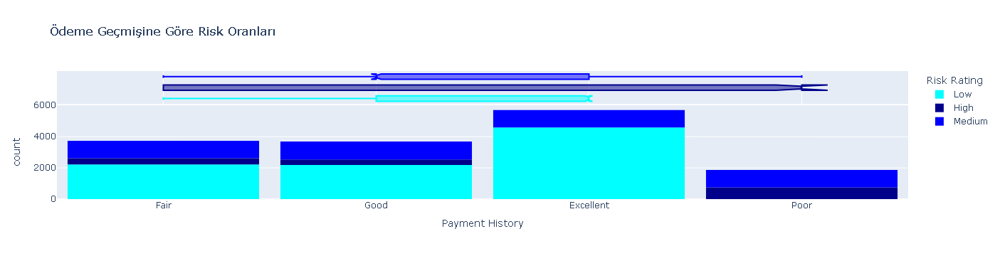

In [17]:
fig = px.histogram(df, 
                   x='Payment History',
                   marginal='box', 
                   color='Risk Rating', 
                   color_discrete_sequence=['aqua', 'darkblue','blue'],
                   title='Ödeme Geçmişine Göre Risk Oranları')
fig.update_layout(bargap=0.1)
fig.show()

Histogram kullanarak ödeme geçmişine göre risk oranlarını grafiğe dönüştürdük ve bu grafikte, ödeme geçmişi iyi olan kişilerin genellikle düşük risk kategorisinde yer aldığını, ödeme geçmişi kötü olanların ise yüksek risk taşıdığını göstermektedir.

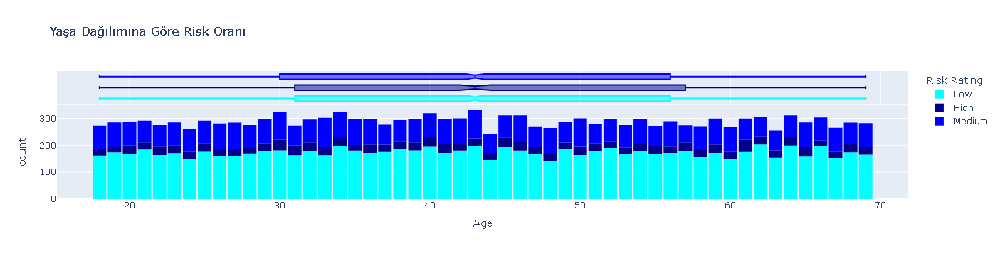

In [19]:
fig = px.histogram(df, 
                   x='Age',
                   marginal='box', 
                   color='Risk Rating', 
                   color_discrete_sequence=['aqua', 'darkblue','blue'],
                   title='Yaşa Dağılımına Göre Risk Oranı')
fig.update_layout(bargap=0.1)
fig.show()

Histogram kullanarak yaş dağılımına göre risk oranlarını grafiğe dönüştürdük. Genel olarak, yaş gruplarına göre risk dağılımında büyük farklar yok. Ancak, daha genç yaşlarda düşük risk oranı biraz daha yüksek görünüyor.

In [21]:
df['Risk Rating'].value_counts()

Risk Rating
Low       9000
Medium    4500
High      1500
Name: count, dtype: int64

Value count ile Risk Rating kolonundaki değerlerin kaç tane olduğunu gösterir

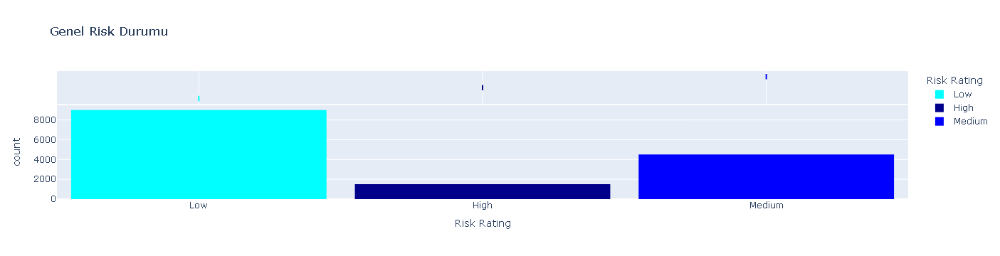

In [23]:
fig = px.histogram(df, 
                   x='Risk Rating',
                   marginal='box', 
                   color='Risk Rating', 
                   color_discrete_sequence=['aqua', 'darkblue','blue'], 
                   title='Genel Risk Durumu')
fig.update_layout(bargap=0.1)
fig.show()

Risk oranlarının dağılımını histogram yöntemiyle gösterdik. Özetle, çoğu kişi düşük risk kategorisinde yer alırken, en az sayıda kişi yüksek risk kategorisinde bulunuyor. Orta risk kategorisi ise bu iki grup arasında yer alıyor.

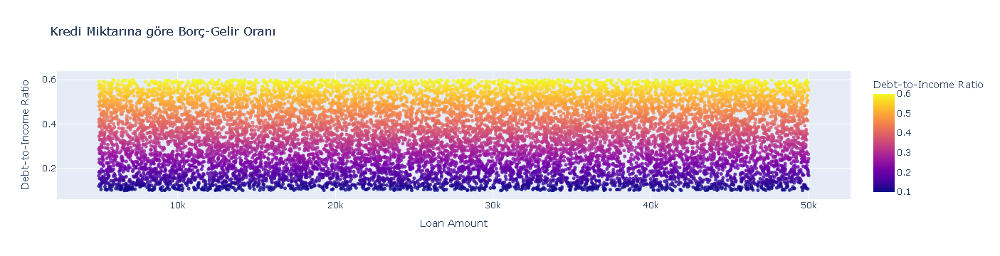

In [25]:
fig = px.scatter(df, 
                 x='Loan Amount',
                 y='Debt-to-Income Ratio',
                 color='Debt-to-Income Ratio', 
                 opacity=0.8, 
                 hover_data=[], 
                 title='Kredi Miktarına göre Borç-Gelir Oranı')
fig.update_traces(marker_size=5)
fig.show()

Kredi miktarı ve Gelir-Durum oranı arasındaki ilişkiyi risk oranı ile renklendirerek  dağılım grafiği yöntemiyle gösterdik. Genel olarak, kredi miktarı arttıkça borç-gelir oranı üzerinde belirgin bir artış veya azalış gözlenmemekte, borç-gelir oranı geniş bir aralıkta dağılmaktadır.

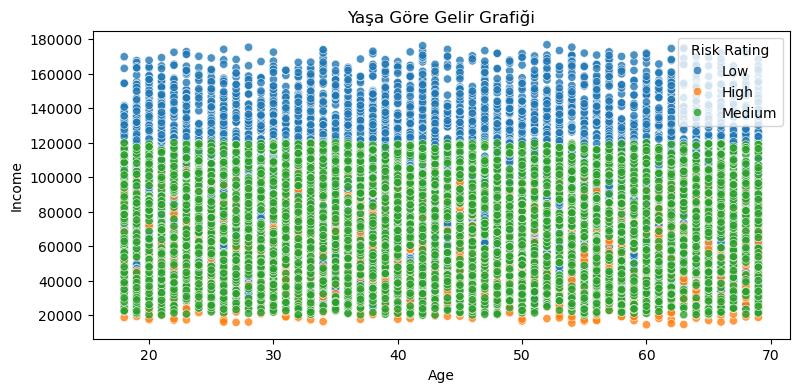

In [27]:
plt.figure(figsize=(9,4))
fra_df = df.sample(15000)
sns.scatterplot(x=df.Age, y=df.Income, hue=df['Risk Rating'], alpha=0.8)
plt.title("Yaşa Göre Gelir Grafiği")
plt.show()

Bu grafikte, yaş ve gelir arasındaki ilişkiyi farklı risk dereceleri için görselleştirmek amacıyla kullandık. Genel olarak, düşük risk grubundaki bireylerin gelir seviyelerinin daha yüksek olduğu, yüksek risk grubundakilerin ise daha düşük gelir seviyelerinde yoğunlaştığı gözlemlenmektedir. Orta risk grubundaki bireyler ise geniş bir gelir aralığına yayılmış durumdadır.

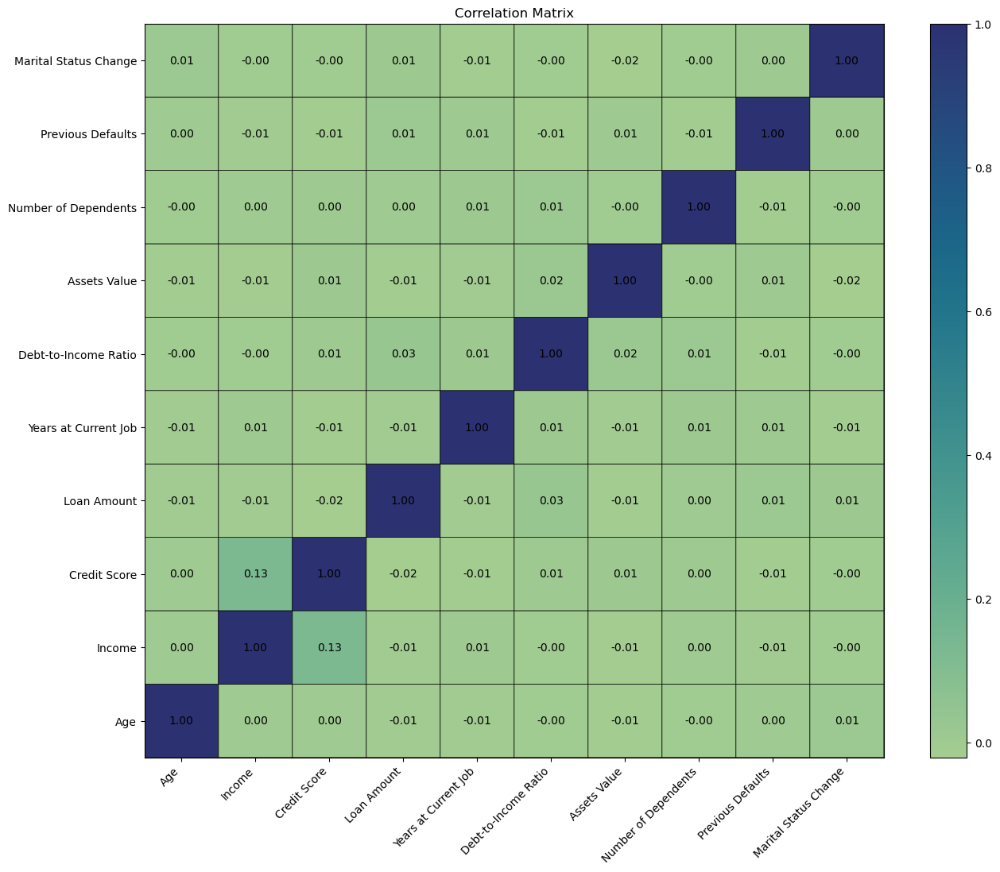

In [29]:
correlation_matrix = fra_df.select_dtypes(['float64', 'int64']).corr()

plt.figure(figsize=(15, 12))
plt.pcolor(correlation_matrix, cmap='crest', edgecolors='k', linewidths=0.5)

for y in range(correlation_matrix.shape[0]):
    for x in range(correlation_matrix.shape[1]):
        plt.text(x + 0.5, y + 0.5, '%.2f' % correlation_matrix.iloc[y, x],
                 horizontalalignment='center',
                 verticalalignment='center')

plt.xticks(np.arange(0.5, len(correlation_matrix.columns), 1), correlation_matrix.columns, rotation=45, ha='right')
plt.yticks(np.arange(0.5, len(correlation_matrix.index), 1), correlation_matrix.index)

plt.colorbar()
plt.title('Correlation Matrix')
plt.show()

Sayısal sütunların arasındaki korelasyonu hesapladık ve Korelasyon Matrix'i oluşturduk.

In [31]:
use_sample = False

Aşağıda veri setimizin önce %10 unu alarak çalıştık, çıkan sonuçları kontrol ettik daha sonra use sample'ı false yaparak verinin tamamıyla daha stabil bir sonuca ulaştık.

In [33]:
sample_fraction = 0.1

Use_sample true kullandığımız durumlarda koşul oluşturup örneklem olarak aldığımız %10 luk veri setinin kopyasını oluşturur. Bu sayede orjinal DataFrame'i değişikliğe uğratmamış oluruz.

In [35]:
if use_sample:
    df = df.sample(frac=sample_fraction).copy()

DataFrame'i train_test_split ile eğitim ve test verisi olarak ikiye ayırdık. Veri setimizin %20 sini test verisi olarak kullandık. hep aynı sonucu alabilmek için random state'i 42 olarak belirledik.

In [37]:
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

Train ve test verilerimizin sütun ve satır sayılarını gösterdik

In [39]:
print('train_df.shape :', train_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (12000, 20)
test_df.shape : (3000, 20)


Eğitim ve test verilerini ayırdıktan sonra analiz ettik

In [41]:
train_df

,Age,Gender,Education Level,Marital Status,Income,Credit Score,Loan Amount,Loan Purpose,Employment Status,Years at Current Job,Payment History,Debt-to-Income Ratio,Assets Value,Number of Dependents,City,State,Country,Previous Defaults,Marital Status Change,Risk Rating
9839,45,Non-binary,Master's,Widowed,46636.071036,671.0,18147.0,Business,Unemployed,9,Poor,0.500303,70970.0,3.0,Lake Jennifer,CA,Wallis and Futuna,0.0,0,High
9680,67,Female,Bachelor's,Married,20578.595030,NaN,15556.0,Home,Unemployed,13,Fair,0.557149,201315.0,2.0,East Bonnieborough,OK,Djibouti,3.0,2,High
7093,30,Female,PhD,Divorced,135947.632343,NaN,14838.0,Personal,Unemployed,5,Fair,0.155286,NaN,3.0,New Ryan,WV,Bouvet Island (Bouvetoya),4.0,0,Low
11293,58,Non-binary,High School,Divorced,NaN,692.0,34510.0,Personal,Unemployed,11,Good,0.547974,38642.0,NaN,Bellland,WY,Myanmar,0.0,2,Medium
820,67,Non-binary,PhD,Widowed,38702.914170,653.0,5303.0,Personal,Unemployed,9,Good,0.525447,105398.0,1.0,Joannton,WY,Niger,1.0,1,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5191,26,Female,PhD,Single,77795.068355,650.0,18985.0,Home,Unemployed,3,Good,0.174542,191694.0,NaN,Port Samanthaview,PR,New Caledonia,3.0,1,Low
13418,27,Male,PhD,Single,54229.000000,709.0,18715.0,Auto,Employed,16,Good,0.223918,51750.0,1.0,Lucasborough,MH,Turkmenistan,4.0,2,Medium
5390,45,Non-binary,PhD,Single,NaN,726.0,45698.0,Business,Unemployed,3,Excellent,0.262329,232976.0,2.0,New Cynthia,CT,Senegal,0.0,1,Low
860,43,Male,PhD,Married,34545.046813,773.0,17020.0,Personal,Self-employed,12,Good,0.444604,47928.0,4.0,South Reginaldchester,KS,Saudi Arabia,1.0,0,Low


In [42]:
test_df

,Age,Gender,Education Level,Marital Status,Income,Credit Score,Loan Amount,Loan Purpose,Employment Status,Years at Current Job,Payment History,Debt-to-Income Ratio,Assets Value,Number of Dependents,City,State,Country,Previous Defaults,Marital Status Change,Risk Rating
11499,49,Female,Bachelor's,Single,50936.000000,602.0,42030.0,Home,Employed,5,Excellent,0.178085,NaN,2.0,Elizabethbury,PA,Palestinian Territory,2.0,2,Medium
6475,38,Female,PhD,Widowed,62348.649921,759.0,17434.0,Personal,Employed,15,Fair,0.341725,210503.0,NaN,East Rickyport,NV,Somalia,0.0,2,Low
13167,56,Male,Bachelor's,Divorced,77109.000000,695.0,31943.0,Home,Employed,6,Fair,0.296833,71010.0,2.0,East Maria,MS,British Indian Ocean Territory (Chagos Archipe...,2.0,1,Medium
862,61,Male,PhD,Divorced,45355.723633,700.0,24314.0,Home,Unemployed,18,Excellent,0.112367,NaN,0.0,Robinbury,IL,Brazil,0.0,0,Low
5970,40,Male,PhD,Widowed,76371.268942,716.0,NaN,Home,Self-employed,13,Excellent,0.175865,104995.0,1.0,North Alexandrafurt,WA,Venezuela,0.0,2,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6216,50,Male,Master's,Divorced,102658.895169,NaN,23452.0,Auto,Self-employed,14,Excellent,0.348185,81557.0,NaN,Guzmanmouth,WA,Greece,4.0,2,Low
3585,19,Male,Associate's,Widowed,151462.203400,681.0,20115.0,Personal,Employed,10,Excellent,0.342283,NaN,0.0,East Moniqueborough,IL,Aruba,1.0,2,Low
10023,39,Non-binary,High School,Divorced,NaN,643.0,7790.0,Auto,Employed,16,Fair,0.352639,51404.0,4.0,New Lauren,MH,Armenia,3.0,2,High
14044,53,Non-binary,PhD,Widowed,96347.000000,797.0,48628.0,Auto,Self-employed,14,Poor,0.385209,22946.0,4.0,Kimchester,TN,Honduras,3.0,1,Medium


Eğitim veri setindeki kolonları (son kolon hariç) listeledik ve girdi olarak input_cols değişkenine atadık. Daha sonra hedef kolonumuzu Risk Rating olarak belirledik ve target_col olarak atadık.

In [44]:
input_cols = list(train_df.columns)[:-1]
target_col = 'Risk Rating'

Atadığımız kolonları analiz ettik

In [46]:
input_cols

['Age',
 'Gender',
 'Education Level',
 'Marital Status',
 'Income',
 'Credit Score',
 'Loan Amount',
 'Loan Purpose',
 'Employment Status',
 'Years at Current Job',
 'Payment History',
 'Debt-to-Income Ratio',
 'Assets Value',
 'Number of Dependents',
 'City',
 'State',
 'Country',
 'Previous Defaults',
 'Marital Status Change']

Model eğitiminde kullanmak üzere eğitim ve test verilerinin bağımlı ve bağımsız değişkenlerin kopyalarını oluşturup değişkenlere atamasını yaptık. Böylece orjinal veri setinde bir değişiklik olmamasını sağladık.

In [48]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

In [49]:
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_col].copy()

In [50]:
train_inputs

,Age,Gender,Education Level,Marital Status,Income,Credit Score,Loan Amount,Loan Purpose,Employment Status,Years at Current Job,Payment History,Debt-to-Income Ratio,Assets Value,Number of Dependents,City,State,Country,Previous Defaults,Marital Status Change
9839,45,Non-binary,Master's,Widowed,46636.071036,671.0,18147.0,Business,Unemployed,9,Poor,0.500303,70970.0,3.0,Lake Jennifer,CA,Wallis and Futuna,0.0,0
9680,67,Female,Bachelor's,Married,20578.595030,NaN,15556.0,Home,Unemployed,13,Fair,0.557149,201315.0,2.0,East Bonnieborough,OK,Djibouti,3.0,2
7093,30,Female,PhD,Divorced,135947.632343,NaN,14838.0,Personal,Unemployed,5,Fair,0.155286,NaN,3.0,New Ryan,WV,Bouvet Island (Bouvetoya),4.0,0
11293,58,Non-binary,High School,Divorced,NaN,692.0,34510.0,Personal,Unemployed,11,Good,0.547974,38642.0,NaN,Bellland,WY,Myanmar,0.0,2
820,67,Non-binary,PhD,Widowed,38702.914170,653.0,5303.0,Personal,Unemployed,9,Good,0.525447,105398.0,1.0,Joannton,WY,Niger,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5191,26,Female,PhD,Single,77795.068355,650.0,18985.0,Home,Unemployed,3,Good,0.174542,191694.0,NaN,Port Samanthaview,PR,New Caledonia,3.0,1
13418,27,Male,PhD,Single,54229.000000,709.0,18715.0,Auto,Employed,16,Good,0.223918,51750.0,1.0,Lucasborough,MH,Turkmenistan,4.0,2
5390,45,Non-binary,PhD,Single,NaN,726.0,45698.0,Business,Unemployed,3,Excellent,0.262329,232976.0,2.0,New Cynthia,CT,Senegal,0.0,1
860,43,Male,PhD,Married,34545.046813,773.0,17020.0,Personal,Self-employed,12,Good,0.444604,47928.0,4.0,South Reginaldchester,KS,Saudi Arabia,1.0,0


İşlemimiz gerçekleşip gerçekleşmediğini anlamak için değişkenleri yazdırarak analiz ettik.

In [52]:
train_targets

9839       High
9680       High
7093        Low
11293    Medium
820         Low
          ...  
5191        Low
13418    Medium
5390        Low
860         Low
7270        Low
Name: Risk Rating, Length: 12000, dtype: object

Numeric_cols değişkenine train_inputs daki tipi sayısal olan kolonları listeleyip atadık.
Categorical_cols değişkenine train_inputs daki tipi nesne olan kolonları listeleyip atadık.Ayrıca kategorik olanlarda bazı kolonları sildilk.

In [54]:
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
categorical_cols = train_inputs.drop(["City", "State", "Country"], axis=1).select_dtypes('object').columns.tolist()

Numerik girdilerimizi istatistiksel olarak özetledik. 

In [56]:
train_inputs[numeric_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
Age,12000.0,43.534750,14.918339,18.000000,31.000000,43.000000,56.000000,69.000000
Income,10179.0,81021.421675,36885.269747,14435.758755,49631.577481,78510.290982,108227.593560,176680.894159
Credit Score,10195.0,716.785091,61.909449,553.000000,667.000000,717.000000,766.000000,847.000000
Loan Amount,10208.0,27379.935051,12981.192793,5000.000000,16252.000000,27436.000000,38523.250000,49998.000000
Years at Current Job,12000.0,9.463583,5.789053,0.000000,4.000000,9.000000,15.000000,19.000000
Debt-to-Income Ratio,12000.0,0.351100,0.143678,0.100004,0.229057,0.351890,0.476844,0.599970
Assets Value,10215.0,159776.185316,80514.889096,20055.000000,90231.500000,159448.000000,228886.000000,299999.000000
Number of Dependents,10210.0,2.030754,1.409299,0.000000,1.000000,2.000000,3.000000,4.000000
Previous Defaults,10187.0,1.996073,1.419820,0.000000,1.000000,2.000000,3.000000,4.000000
Marital Status Change,12000.0,0.999667,0.814896,0.000000,0.000000,1.000000,2.000000,2.000000


Kategorik kolonlardaki benzersiz değerlerin adetlerini görüntüledik.

In [58]:
train_inputs[categorical_cols].nunique()

Gender               3
Education Level      5
Marital Status       4
Loan Purpose         4
Employment Status    3
Payment History      4
dtype: int64

Numerik veriler arasında null olan değerleri SimpleImputer kullanarak ortalamalarına göre doldurması için değişkene atadık.

In [60]:
imputer = SimpleImputer(strategy = 'mean')

Numerik olan kolonlarda boş satırların toplamlarını görüntüledik

In [62]:
df[numeric_cols].isna().sum()

Age                         0
Income                   2250
Credit Score             2250
Loan Amount              2250
Years at Current Job        0
Debt-to-Income Ratio        0
Assets Value             2250
Number of Dependents     2250
Previous Defaults        2250
Marital Status Change       0
dtype: int64

Numerik kolonları imputer ile eğittik.

In [64]:
imputer.fit(df[numeric_cols])

SimpleImputer()

Eğittiğimiz kolonları istatistiksel olarak listeledik.

In [66]:
list(imputer.statistics_)

[43.452666666666666,
 81087.0579890407,
 716.3498823529412,
 27450.010901960784,
 9.476266666666668,
 0.3504380588282313,
 159741.49717647058,
 2.0265098039215688,
 1.9924705882352942,
 0.9984666666666666]

Eğitttiğimiz imputer değişkeni ile eğitim ve test verilerini dönüştürdük.

In [68]:
train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

İşlemin gerçekleşip gerçekleşmediğini kontrol ettik.

In [70]:
train_inputs[numeric_cols].isna().sum()

Age                      0
Income                   0
Credit Score             0
Loan Amount              0
Years at Current Job     0
Debt-to-Income Ratio     0
Assets Value             0
Number of Dependents     0
Previous Defaults        0
Marital Status Change    0
dtype: int64

"MinMaxScaler" ile numerik veriler Y ekseninde 0 ve 1 arasında sıkıştırıldı.

In [72]:
scaler = MinMaxScaler()

Numerik kolonlar Scaler ile eğitildi.

In [74]:
scaler.fit(df[numeric_cols])

MinMaxScaler()

Numerik kolonların minimum değerleri liste şeklinde görüntülendi.

In [76]:
print('Minimum:')
print(numeric_cols)
print(list(scaler.data_min_))

Minimum:
['Age', 'Income', 'Credit Score', 'Loan Amount', 'Years at Current Job', 'Debt-to-Income Ratio', 'Assets Value', 'Number of Dependents', 'Previous Defaults', 'Marital Status Change']
[18.0, 14435.758754642156, 553.0, 5000.0, 0.0, 0.1000042161056521, 20055.0, 0.0, 0.0, 0.0]


Numerik kolonlar scaler ile dönüştürüldü.

In [78]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

Kategorik kolonların kaç adet benzersiz değer içerdiğini görüntüledik.

In [80]:
df[categorical_cols].nunique()

Gender               3
Education Level      5
Marital Status       4
Loan Purpose         4
Employment Status    3
Payment History      4
dtype: int64

Modele sokmak için kategorik verileri sayısal değerlere dönüştürme işlemlerine başladık. Sparse_output false olarak aldığımızda veriyi sıkıştırılmamış olarak alır. Handle_unknown ignore olarak aldığımızda ise eğitim setinde olmayan verilerle karşılaştığında yoksayması için kullandık.

In [82]:
encoder = OneHotEncoder(sparse_output = False, handle_unknown = 'ignore')

Kategorik kolonları encoder ile eğittik.

In [84]:
encoder.fit(df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse_output=False)

Yeni oluşturulan kategorik kolonların isimlerini listeliyor. 

In [86]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))

Kategorik test ve eğitim kolonlarını encoder ile dönüştürdük. 

In [88]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])

In [89]:
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

Veriler Parquet ile diske kaydedildi.

In [91]:
train_inputs.to_parquet('train_inputs.parquet')
test_inputs.to_parquet('test_inputs.parquet')

In [92]:
pd.DataFrame(train_targets).to_parquet('train_targets.parquet')
pd.DataFrame(test_targets).to_parquet('test_targets.parquet')

In [93]:
train_inputs = pd.read_parquet('train_inputs.parquet')
test_inputs = pd.read_parquet('test_inputs.parquet')

In [94]:
train_targets = pd.read_parquet('train_targets.parquet')[target_col]
test_targets = pd.read_parquet('test_targets.parquet')[target_col]

x_train ve x_test bağımsız değişkenleri modelin eğitimi ve test edilmesi için kullanılacak olan veri setlerinin özelliklerini belirler. (numerik ve kategorik olan kolonların birleşimi)

In [96]:
X_train = train_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

'Lojistik Regresyon' ile ilk modelimiz oluşturuldu.

In [98]:
model = LogisticRegression(solver='liblinear')

Modeli eğittik.

In [100]:
model.fit(train_inputs[numeric_cols + encoded_cols], train_targets)

LogisticRegression(solver='liblinear')

Eğitim veri seti için tahmin modeli.

In [102]:
train_preds = model.predict(X_train)

In [103]:
train_preds

array(['Medium', 'Medium', 'Low', ..., 'Low', 'Low', 'Low'], dtype=object)

In [104]:
train_targets

9839       High
9680       High
7093        Low
11293    Medium
820         Low
          ...  
5191        Low
13418    Medium
5390        Low
860         Low
7270        Low
Name: Risk Rating, Length: 12000, dtype: object

Test veri seti için tahmin modeli.

In [106]:
test_preds = model.predict(X_test)

In [107]:
test_preds

array(['Medium', 'Low', 'Medium', ..., 'Medium', 'Medium', 'Low'],
      dtype=object)

In [108]:
test_targets

11499    Medium
6475        Low
13167    Medium
862         Low
5970        Low
          ...  
6216        Low
3585        Low
10023      High
14044    Medium
12965    Medium
Name: Risk Rating, Length: 3000, dtype: object

Eğitim veri seti için tahmin olasılığı

In [110]:
train_probs = model.predict_proba(X_train)

In [111]:
train_probs

array([[4.63210753e-01, 1.87802033e-03, 5.34911227e-01],
       [2.69865193e-01, 1.76563500e-03, 7.28369172e-01],
       [1.94847568e-04, 8.24321418e-01, 1.75483735e-01],
       ...,
       [5.33510783e-06, 8.36695702e-01, 1.63298963e-01],
       [1.14466888e-03, 7.22519185e-01, 2.76336146e-01],
       [3.60137141e-04, 7.96407335e-01, 2.03232528e-01]])

model.classes_

Eğitim hedef kolonu ile eğitim tahmini doğruluk skorunu hesaplattık.

In [114]:
accuracy_score(train_targets, train_preds)

0.8051666666666667

Test hedef kolonu ile test tahmini doğruluk skorunu hesaplattık.

In [116]:
accuracy_score(test_targets, test_preds)

0.8143333333333334

Modelimizin eğitim verileri üzerinde ne kadar iyi performans gösterdiğini sayısal bir skor olarak döndürür.

In [118]:
model.score(X_train, train_targets)

0.8051666666666667

Modelimizin test verileri üzerinde ne kadar iyi performans gösterdiğini sayısal bir skor olarak döndürür.

In [120]:
model.score(X_test, test_targets)

0.8143333333333334

'Dummy Classifier' ile aptal bir model oluşturduk. Modelden elde ettiğimiz skor düşük çıktı.

In [122]:
from sklearn.dummy import DummyClassifier

dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X_train, train_targets)

dummy_y_pred = dummy_clf.predict(X_test)
dummy_accuracy = accuracy_score(test_targets, dummy_y_pred)

print(dummy_accuracy)

0.603


In [123]:
confusion_matrix(train_targets, train_preds, normalize='true')

array([[2.16417910e-01, 1.94859038e-01, 5.88723051e-01],
       [4.17188152e-04, 9.92212488e-01, 7.37032402e-03],
       [1.85956148e-02, 3.52484041e-01, 6.28920344e-01]])

Aldığımız sonuçları Confusion matrix ile görüntüledik.

In [125]:
def predict_and_plot(inputs, targets, name=''):
    preds = model.predict(inputs)
    
    accuracy = accuracy_score(targets, preds)
    print("İsabet: {:.2f}%".format(accuracy * 100))
    
    cf = confusion_matrix(targets, preds, normalize='true')
    plt.figure()
    sns.heatmap(cf, annot=True)
    plt.xlabel('Tahmin')
    plt.ylabel('Hedef')
    plt.title('{} Karışıklık Matrisi'.format(name));
    return preds

İsabet: 80.52%


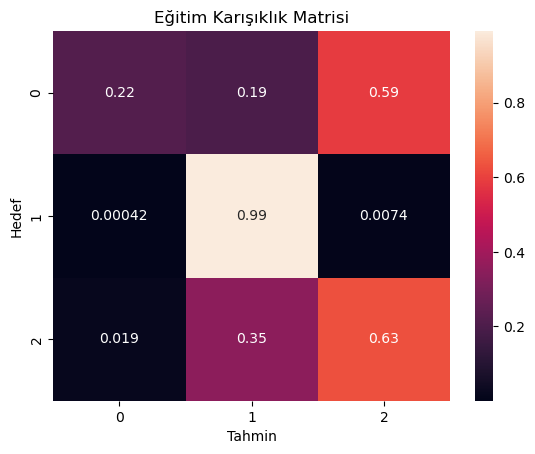

In [126]:
train_preds = predict_and_plot(X_train, train_targets, 'Eğitim')

Bu matris, eğitim tahminine göre modelin sınıf 1'de çok başarılı olduğunu, ancak sınıf 0 ve sınıf 2'de bazı yanlış sınıflandırmalar yaptığını göstermektedir. Özellikle, modelin sınıf 0'ı sınıf 2 ile karıştırma eğiliminde olduğu görülebilir. Genel olarak, modelin performansı oldukça iyi görünmekle birlikte, bazı sınıflarda hata yapabilmektedir.

İsabet: 81.43%


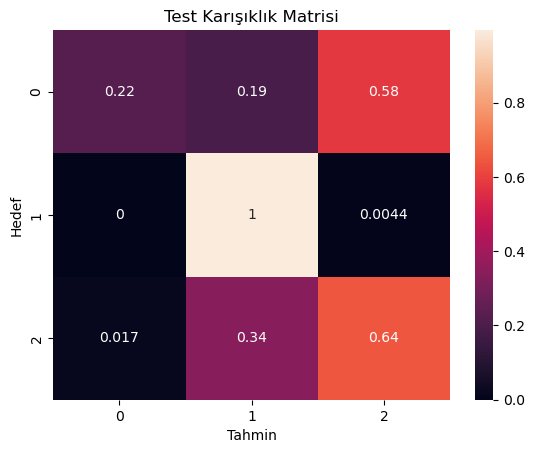

In [128]:
test_preds = predict_and_plot(X_test, test_targets, 'Test')

Bu fonksiyon ile bir modele ya da veriye dayalı olmadan, mantık içermeyen rastgele tahminler yaptık.

In [130]:
def random_guess(inputs):
    return np.random.choice(["Low", "Medium", "High"], len(inputs))

Random tahmin skorunu görüntüledik.

In [132]:
accuracy_score(test_targets, random_guess(X_test))

0.333

In [133]:
def all_no(inputs):
    return np.full(len(inputs), "Low")

In [134]:
accuracy_score(test_targets, all_no(X_test))

0.603

'Decision Tree' Modeli

In [136]:
model = DecisionTreeClassifier(random_state=42)

Karar ağacı modelimizi eğitiyoruz.

In [138]:
model.fit(X_train, train_targets)

DecisionTreeClassifier(random_state=42)

Modeli eğittikten sonra tahmin ettirdik.

In [140]:
train_preds = model.predict(X_train)

In [141]:
train_preds

array(['High', 'High', 'Low', ..., 'Low', 'Low', 'Low'], dtype=object)

Tahmin değerlerinin sayısı

In [143]:
pd.value_counts(train_preds)

C:\Users\Deniz\AppData\Local\Temp\ipykernel_66604\1258350197.py:1: FutureWarning:

pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.



Low       7191
Medium    3603
High      1206
Name: count, dtype: int64

Eğitim setinin tahmin olasılığı

In [145]:
train_probs = model.predict_proba(X_train)

In [146]:
train_probs

array([[1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       ...,
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.]])

Eğitim hedefi ile eğitim tahmini %100 oranında doğru sınıflandırma yapıyor.

In [148]:
accuracy_score(train_targets, train_preds)

1.0

Test hedefi ile test tahmini %82.6 oranında doğru sınıflandırma yapıyor.

In [150]:
accuracy_score(test_targets, test_preds)

0.8143333333333334

Modelimizin eğitim verileri üzerinde ne kadar iyi performans gösterdiğini sayısal bir skor olarak döndürür.

In [152]:
model.score(X_train, train_targets)

1.0

Modelimizin test verileri üzerinde ne kadar iyi performans gösterdiğini sayısal bir skor olarak döndürür.

In [154]:
model.score(X_test, test_targets)

0.7533333333333333

Ağaç grafiği, farklı eğitim seviyeleri ve kredi geçmişi gibi faktörlere göre bölünmeler yaparak hedef değişkeni tahmin etmeye çalışıyor. 

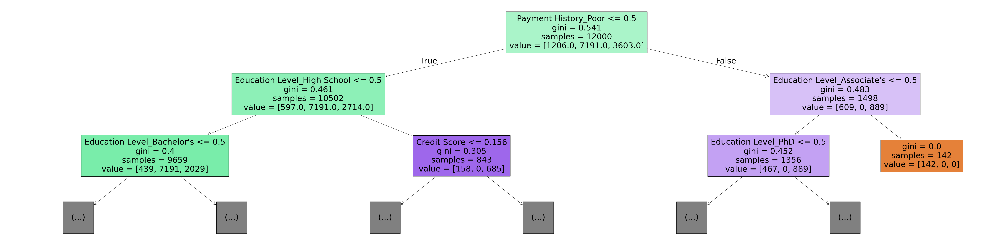

In [156]:
plt.figure(figsize=(80,20))
plot_tree(model, feature_names=X_train.columns, max_depth=2, filled=True);

Modelimize göre eğitilen verilerin önem derecelerine göre sıralama yaptırdık ve görüntüledik.

In [158]:
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

In [159]:
importance_df.head(10)

,feature,importance
32,Payment History_Poor,0.142134
14,Education Level_Bachelor's,0.133136
2,Credit Score,0.117411
15,Education Level_High School,0.112261
1,Income,0.091013
5,Debt-to-Income Ratio,0.051031
3,Loan Amount,0.046397
6,Assets Value,0.041917
0,Age,0.039276
4,Years at Current Job,0.036971


Önem derecelerine göre bir grafik oluşturduk.

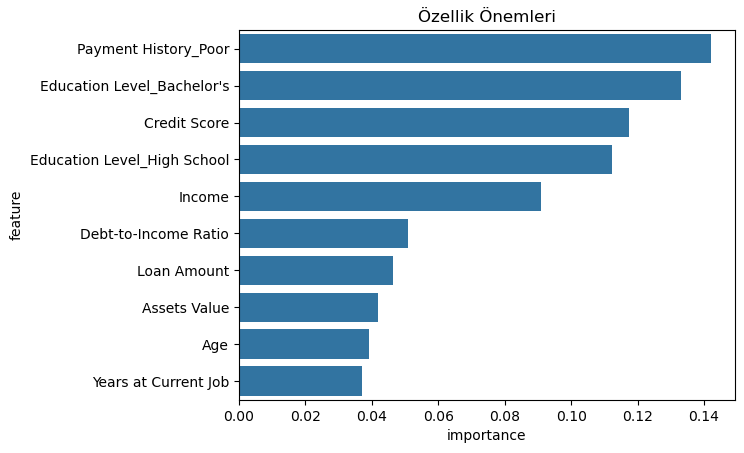

In [161]:
plt.title('Özellik Önemleri')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

'Decision Tree' Modeli. Bu modelde 2 hiperparametre kullanarak derinliklerine göre inceleme yaptık çıkan sonuçları görüntüledik.

In [163]:
model = DecisionTreeClassifier(max_depth=5, random_state=42)

In [164]:
model.fit(X_train, train_targets)

DecisionTreeClassifier(max_depth=5, random_state=42)

In [165]:
accuracy_score(train_targets, train_preds)

1.0

In [166]:
accuracy_score(test_targets, test_preds)

0.8143333333333334

In [167]:
model.score(X_train, train_targets)

0.8198333333333333

In [168]:
model.score(X_test, test_targets)

0.829

"DECİSİON TREE MAX LEAF NODES" İLE DÖRDÜNCÜ MODEL OLUŞTURULDU

In [170]:
model = DecisionTreeClassifier(max_leaf_nodes=128, random_state=42)

In [171]:
model.fit(X_train, train_targets)

DecisionTreeClassifier(max_leaf_nodes=128, random_state=42)

In [172]:
model.score(X_train, train_targets)

0.8576666666666667

In [173]:
model.score(X_test, test_targets)

0.8356666666666667

In [174]:
accuracy_score(train_targets, train_preds)

1.0

In [175]:
accuracy_score(test_targets, test_preds)

0.8143333333333334

In [176]:
model.tree_.max_depth

20

"RANDOM FOREST" modeli diğer modeller ile kıyaslayınca verdiği sonuçlara göre bu veri seti için en makul modeldir. Sadece verilerdeki örnekleri iyi öğrenmekle kalmadı, aynı zamanda yeni verilerde de iyi sonuçlar verebilir.

In [178]:
model = RandomForestClassifier(n_jobs=-1, random_state=42)

In [179]:
model.fit(X_train, train_targets)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [180]:
accuracy_score(train_targets, train_preds)

1.0

In [181]:
accuracy_score(test_targets, test_preds)

0.8143333333333334

In [182]:
model.score(X_train, train_targets)

1.0

In [183]:
model.score(X_test, test_targets)

0.835

In [184]:
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

In [185]:
importance_df.head(10)

,feature,importance
32,Payment History_Poor,0.101768
2,Credit Score,0.099084
1,Income,0.093803
15,Education Level_High School,0.090141
14,Education Level_Bachelor's,0.084937
5,Debt-to-Income Ratio,0.050183
3,Loan Amount,0.048422
6,Assets Value,0.047266
13,Education Level_Associate's,0.045764
0,Age,0.043616


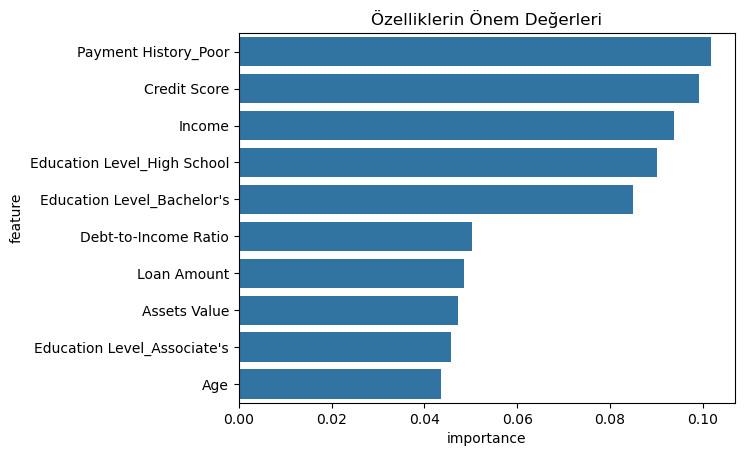

In [186]:
plt.title('Özelliklerin Önem Değerleri')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

SINGLE INPUT
Öncelikle eksik değerlerin doldurulması ve verilerin standartlaştırılması gibi veri ön işleme adımları gerçekleştirdik. Sayısal ve kategorik veriler ayrı ayrı işlendi ve birleştirildi. Ardından, RandomForestClassifier kullanılarak modeli eğittik ve test verileri üzerinde tahminler yaptırdık. Modelin doğruluğu hesaplanarak performansı değerlendirildi ve yeni bir girdi verisi için risk oranı tahmini yapıldı.

In [188]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

In [189]:
input_data = {
    'Age': 30,
    'Gender': 'Male',
    'Education Level': 'Masters',
    'Marital Status': 'Divorced',
    'Income': 100,
    'Loan Amount': 1500,
    'Loan Purpose': 'Personal',
    'Employment Status': 'Employed',
    'Years at Current Job': 1,
    'Payment History': 'Poor',
    'Debt-to-Income Ratio': 0.9,
    'Assets Value': 100,
    'Number of Dependents': 1,
    'City': 'New York',
    'State': 'NY',
    'Country': 'USA',
    'Previous Defaults': 0,
    'Marital Status Change': 0
}

In [190]:
input_df = pd.DataFrame([input_data])

In [191]:
numeric_features = ['Age', 'Income', 'Loan Amount', 'Years at Current Job', 'Debt-to-Income Ratio', 'Assets Value', 'Number of Dependents', 'Previous Defaults', 'Marital Status Change']
categorical_features = ['Gender', 'Education Level', 'Marital Status', 'Loan Purpose', 'Employment Status', 'Payment History', 'City', 'State', 'Country']

In [192]:
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

In [193]:
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

In [194]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [195]:
preprocessor.fit(df)

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer', SimpleImputer()),
                                                 ('scaler', StandardScaler())]),
                                 ['Age', 'Income', 'Loan Amount',
                                  'Years at Current Job',
                                  'Debt-to-Income Ratio', 'Assets Value',
                                  'Number of Dependents', 'Previous Defaults',
                                  'Marital Status Change']),
                                ('cat',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['Gender', 'Education Level', 'Marital Status',
                                  'Loan Purpose', 'Employment Status',
                                  'Payment History', 'City', 'State',
                                  'Country'])])

In [196]:
input_transformed = preprocessor.transform(input_df)

In [197]:
example_model = RandomForestClassifier(n_jobs=-1, random_state=42)
X_train = preprocessor.transform(df.drop(columns=['Risk Rating']))
y_train = df['Risk Rating']
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
example_model.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [198]:
y_pred = example_model.predict(X_test)

In [199]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Model accuracy: {accuracy}")

Model accuracy: 0.806


In [325]:
result = example_model.predict(input_transformed)
print(f"Girilen verilen için tahmin edilen risk oranı: {result[0]}")


Girilen verilen için tahmin edilen risk oranı: Medium
